<p style="padding: 10px; border: 1px solid black;">
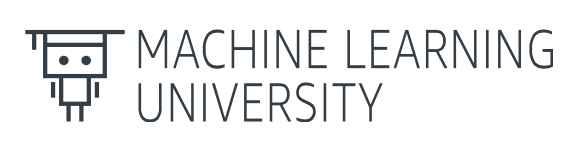 <br/>

# <a name="0">MLU Workshop: Image Generation with Diffusion Models </a>
## <a name="0">Lab 1: Inference with Diffusion Models </a>

This notebook demonstrates how to use a pre-trained diffusion model for text-to-image generation. Diffusion models are trained to progressively remove noise from an image over several steps. For text-to-image tasks, the diffusion models perform the donoising process conditioned on the text prompt. This allows the models to generate images corresponding to the prompt given by the user.

[Amazon JumpStart](https://docs.aws.amazon.com/sagemaker/latest/dg/studio-jumpstart.html) offers several pre-trained models including diffusion models to kickstart project development. JumpStart also offers methods to fine-tune these pre-trained models for specific use cases. You can view the list of available models on JumpStart through its landing page. Please refer to this [page](https://sagemaker.readthedocs.io/en/stable/overview.html#use-sagemaker-jumpstart-algorithms-with-pretrained-models) for more information on using JumpStart programatically.

1. <a href="#1">Import libraries</a>
2. <a href="#2">Adding Noise to Image</a>
3. <a href="#3">Using Diffusion Models for Image Generation</a>
4. <a href="#4">Set up AWS Credentials and Retrieve Resources</a>
5. <a href="#5">Deploy Model from JumpStart to an Endpoint</a>
6. <a href="#6">Inference Parameters</a>
7. <a href="#7">Prompt Engineering for Text-to-Image Models</a>
8. <a href="#8">Clean up the endpoint</a>    
9. <a href="#9">Quizzes</a>

__Jupyter notebooks environment__:

* Jupyter notebooks allow creating and sharing documents that contain both code and rich text cells. If you are not familiar with Jupyter notebooks, read more [here](https://jupyter-notebook-beginner-guide.readthedocs.io/en/latest/what_is_jupyter.html). 
* This is a quick-start demo to bring you up to speed on coding and experimenting with machine learning. Move through the notebook __from top to bottom__. 
* Run each code cell to see its output. To run a cell, click within the cell and press __Shift+Enter__, or click __Run__ from the top of the page menu. 
* A `[*]` symbol next to the cell indicates the code is still running. A `[#]` symbol, where # is an integer, indicates it is finished.
* Beware, __some code cells might take longer to run__, sometimes 5-10 minutes (depending on the task, installing packages and libraries, training models, etc.)
    
    
Please work top to bottom of this notebook and don't skip sections as this could lead to error messages due to missing code.

---

You will be presented with two kinds of exercises throughout the notebook: activities and challenges. <br/>

| 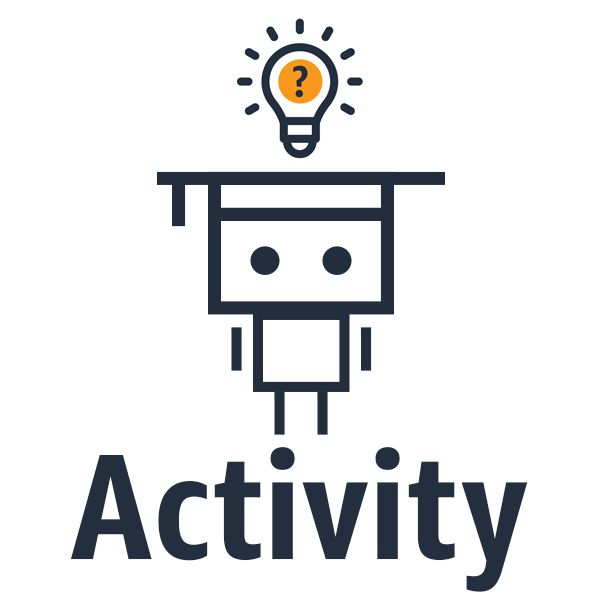| 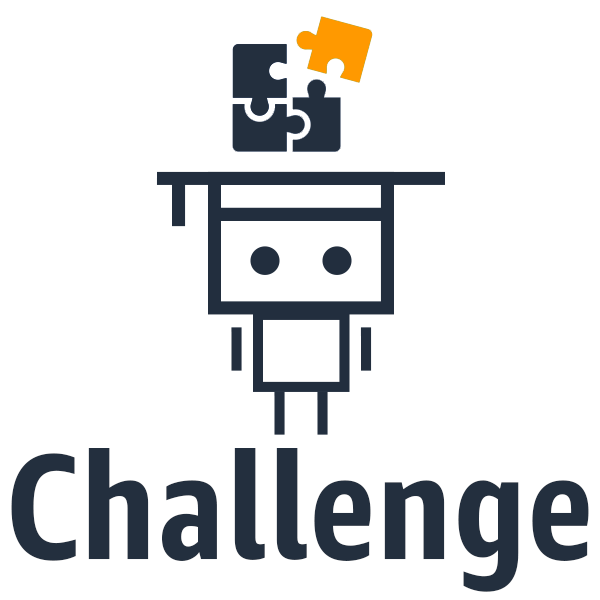|
| --- | --- |
|<p style="text-align:center;">No coding is needed for an activity. You try to understand a concept, <br/>answer questions, or run a code cell.</p> |<p style="text-align:center;">Challenges are where you test your understanding by taking a short quiz.</p> |

----    

Let's start by loading some libraries and packages!

---

### <a name="1">Import libraries</a>
(<a href="#0">Go to top</a>)


First, let's install and import the necessary libraries.

In [1]:
!pip3 install --upgrade -q sagemaker --quiet

In [2]:
from ipywidgets import interact, widgets, fixed
from IPython.display import display

import sagemaker, boto3, json
from sagemaker import get_execution_role
from sagemaker.predictor import Predictor
from sagemaker import image_uris, model_uris, script_uris, hyperparameters
from sagemaker.model import Model
from sagemaker.utils import name_from_base


import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.widgets import RangeSlider
import numpy as np

sagemaker.config INFO - Not applying SDK defaults from location: /etc/xdg/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /home/ec2-user/.config/sagemaker/config.yaml


---
### <a name="#2">Adding Noise to Image</a>
(<a href="#0">Go to top</a>)

Diffusion models are *generative* models, which means they are intended to generate realistic looking images that resemble the data they were trained upon. 
During training, diffusion models undergo two stages: (1) the forward process and (2) the reverse process.
In this section we will examine the forward process.

During the forward process, an image is successively transformed into pure noise by the addition of Guassian noise. At each step, a noise matrix is added to the image which damages the quality of the image. Over hundreds of steps, the image eventually turns into pure Guassian noise. The models are then trained to *denoise* the noisy image back to the original one over multiple steps, where each step involves predicting the noise matrix for that time step and denoising the image.

In this section, we will simulate the forward process by successively adding a sampled Gaussian noise matrix to the following image. 

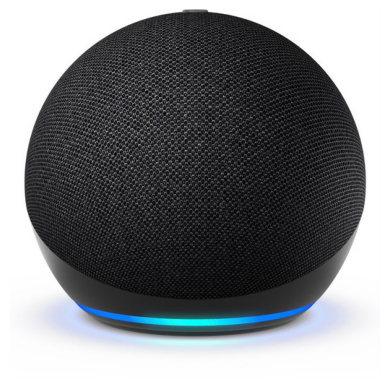

In [3]:
img = mpimg.imread("data/echo-dot-12.jpg")
plt.axis("off")
plt.imshow(img)

Let's define a helper function that will be used to add Guassian noise to the image progressively.

In [4]:
# Helper function to progressively add noise to the image
def add_noise(image, num_steps=0):
    row, col, ch = image.shape
    mean = 0
    var = 1000
    sigma = var**0.5
    noisy = image
    for i in range(num_steps):
        # Sample from a guassian distribution
        gauss = np.random.normal(mean, sigma, (row, col, ch))

        # Add the noise to the image
        noisy = noisy + gauss

        # Clip the pixel values to be in the valid range
        noisy = np.clip(noisy, 0, 255)

        # Remove the axis from the image
        plt.axis("off")

    return plt.imshow(np.array(noisy, dtype=np.int32))

<div style="border: 4px solid coral; text-align: center; margin: auto;">
    <h2><i>Try it Yourself!</i></h2>
    <br>
    <p style="text-align:center;margin:auto;">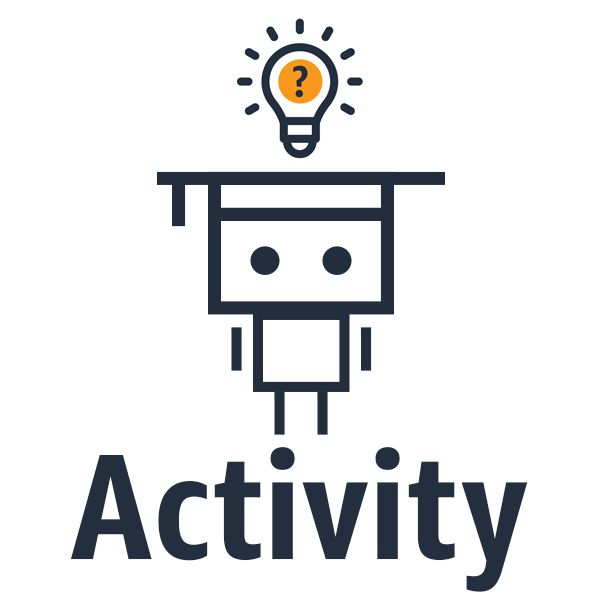 </p>
    <p style=" text-align: center; margin: auto;">Try moving the slider and observe how noise gets progressively added to the image.</p>
    <br>
</div>

In [5]:
interact(add_noise, image=fixed(img), num_steps=(0, 60, 10))

interactive(children=(IntSlider(value=0, description='num_steps', max=60, step=10), Output()), _dom_classes=('…

<function __main__.add_noise(image, num_steps=0)>

### <a name="#3">Using Diffusion Models for Image Generation</a>
(<a href="#0">Go to top</a>)

Text-to-image models are useful to generate realistic or artistic images using a text prompt.

In the previous section, we examined how successively adding noise to an image over several steps can transform the image to pure noise. This approach is inspired by the the concept of diffusion in physics. The forward process can be perceived as an ink drop *diffusing* in a glass of water till it can no longer be recognized.  

Once an image has been transformed into pure noise, the diffusion model is trained to recover the original image by repeatedly removing the noise from the image till the original image is fully recovered. In this lab, we use a stable diffusion model, trained to generate images conditioned on a text prompt using the denoising process.


| 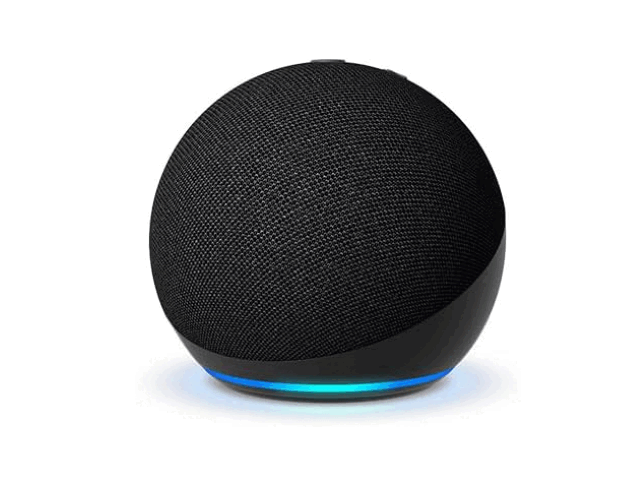| 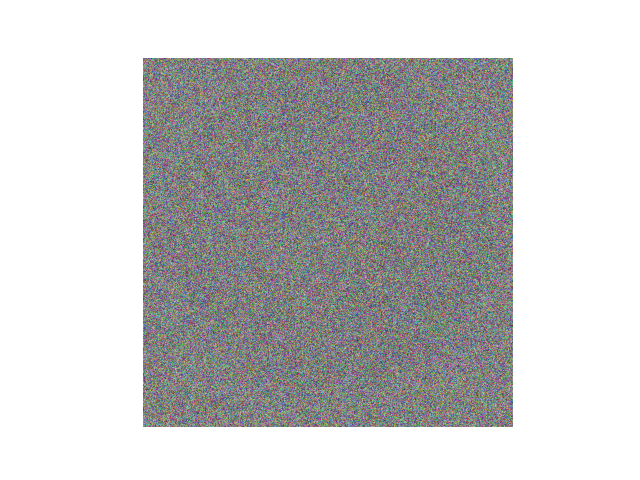|
| --- | --- |
|<p style="text-align:center;">Forward process progressively adds noise to the image till it is virtually pure noise.</p> |<p style="text-align:center;">The reverse process repeatedly removes noise from the image to retrieve the original image.</p> |


### <a name="4">Set up AWS Credentials and Retrieve Resources</a>
(<a href="#0">Go to top</a>)

Let's set up the neccessary credentials, define the model configurations and retrieve the artifacts for deploying the model to an endpoint.

In [6]:
# Define the role
aws_role = get_execution_role()

# Define the region
aws_region = boto3.Session().region_name

# Instantiate the sagemaker session
sess = sagemaker.Session()

#### Select the model for inference

You can select any text-to-image model available on JumpStart by setting the `model_id` and `model_version`. A complete list of available models is available [here](https://docs.aws.amazon.com/sagemaker/latest/dg/jumpstart-foundation-models.html). 

In [10]:
# Set the model_id and version
model_id = "model-txt2img-stabilityai-stable-diffusion-v2-1-base"
model_version = "1.*"  # fetches the latest available version

# Name of the endpoint for deployment
endpoint_name = f"mlu-{model_id}"

# Define the instance type for hosting the mo del
instance_type = "ml.g4dn.xlarge"

#### Retrieve the artifacts
In the following cell we will retrieve the docker container uri for deploying the model. We will be using the HuggingFace container image for the default model. The image is automatically infered from the `model_id` and the `model_version`.

We then load the inference script for the endpoint. This includes all dependencies and scripts for model loading, inference handling etc. We also load the `model_uri` which includes the pre-trained nvidia-ssd model and parameters.

In [11]:
# Retrieve the inference docker container uri.
deploy_image_uri = image_uris.retrieve(
    region=None,
    framework=None,  # automatically inferred from model_id
    image_scope="inference",
    model_id=model_id,
    model_version=model_version,
    instance_type=instance_type,
)

# Retrieve the inference script uri.
deploy_source_uri = script_uris.retrieve(
    model_id=model_id, model_version=model_version, script_scope="inference"
)


# Retrieve the model uri. This includes the pre-trained nvidia-ssd model and parameters.
model_uri = model_uris.retrieve(
    model_id=model_id, model_version=model_version, model_scope="inference"
)

### <a name="#5">Deploy Model from JumpStart to an Endpoint</a>
(<a href="#0">Go to top</a>)

Now that we have defined the model configurations and retrieved all the artifacts for deployment, let's define a sagemaker model instance and deploy it to an endpoint.

In [12]:
# Create the SageMaker model instance
model = Model(
    image_uri=deploy_image_uri,
    source_dir=deploy_source_uri,
    model_data=model_uri,
    entry_point="inference.py",  # entry point file in source_dir and present in deploy_source_uri
    role=aws_role,
    # predictor_cls=Predictor,
    name=endpoint_name,
)

# Deploy the Model.
model_predictor = model.deploy(
    initial_instance_count=1,
    instance_type=instance_type,
    # predictor_cls=Predictor,
    endpoint_name=endpoint_name,
)

predictor = Predictor(endpoint_name=endpoint_name)

--------------!

----
### <a name="#6">Inference Parameters</a>
(<a href="#0">Go to top</a>)

This model also supports many advanced parameters while performing inference. They include:

* **prompt**: prompt to guide the image generation. Must be specified and can be a string or a list of strings.
* **width**: width of the generated image. If specified, it must be a positive integer divisible by 8.
* **height**: height of the generated image. If specified, it must be a positive integer divisible by 8.
* **num_inference_steps**: Number of denoising steps during image generation. More steps lead to higher quality image. If specified, it must a positive integer.
* **guidance_scale**: Higher guidance scale results in image closely related to the prompt, at the expense of image quality. If specified, it must be a float. guidance_scale<=1 is ignored.
* **negative_prompt**: guide image generation against this prompt. If specified, it must be a string or a list of strings and used with guidance_scale. If guidance_scale is disabled, this is also disabled. Moreover, if prompt is a list of strings then negative_prompt must also be a list of strings. 
* **num_images_per_prompt**: number of images returned per prompt. If specified it must be a positive integer. 
* **seed**: Fix the randomized state for reproducibility. If specified, it must be an integer.

***

Let's define an inference payload with the required inference parameters.

In [13]:
from mlu_utils.helper import query_response

# Inference parameters
payload = {
    "prompt": "a painting of sunset in seattle",
    "num_images_per_prompt": 1,
    "num_inference_steps": 50,
    "guidance_scale": 7.5,
    "seed": 1,
}

We can now query the endpoint with the prompt along with the inference parameters defined in the payload dict.

<div style="border: 4px solid coral; text-align: center; margin: auto;">
    <h2><i>Try it Yourself!</i></h2>
    <br>
    <p style="text-align:center;margin:auto;">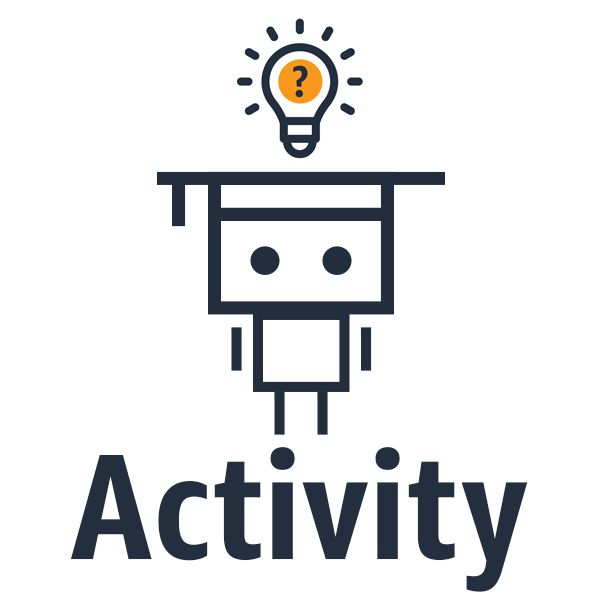 </p>
    <p style=" text-align: center; margin: auto;">Try different prompts to examine the images generated.</p>
    <br>

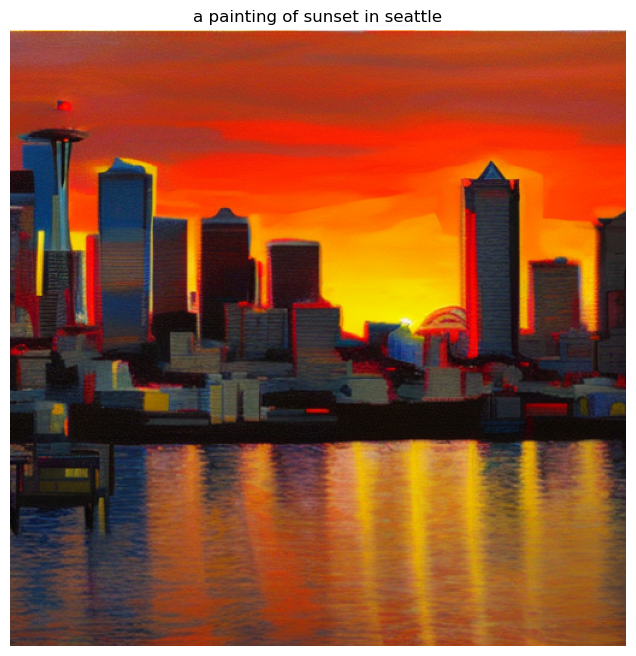

In [15]:
query_response(predictor, payload)

----
### <a name="#7">Prompt Engineering for Text-to-Image Models</a>
(<a href="#0">Go to top</a>)

We can broadly divide a prompt into three components:
1. Type of image such as photograph, sketch, painting, etc.
2. Description of the subject, object, environment, scene etc.
3. Style of the image like realistic, artistic, type of art etc.

By changing these components, we can generate different images. Adding more details help in the generation process.

To generate a realistic image, you can use phrases such as “a photo of”, “a photograph of”, “realistic” or “hyper realistic”. 

To generate images using different artistic styles you can use phrases like "surrealist painting", "oil painting", "pencil drawing", “pop art”, “digital art”, “anime”, “cartoon”, “futurism”, “watercolor”, “manga” etc

You can change the initial prompt to adopt a different style this time. 

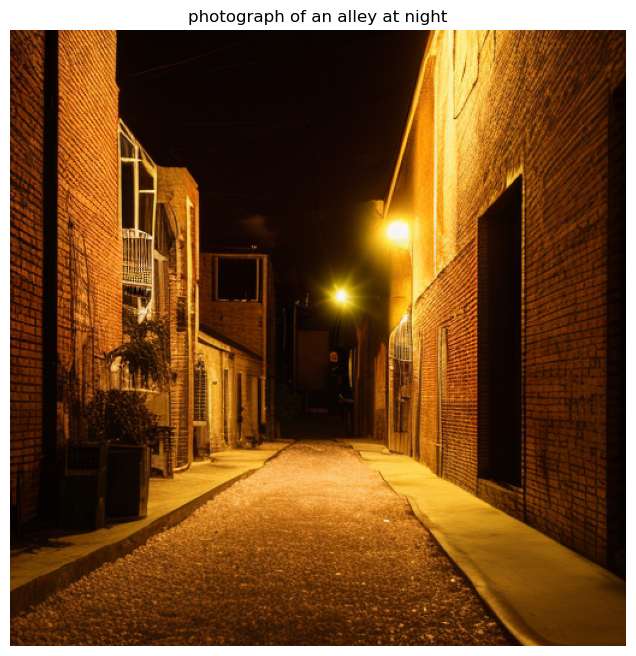

In [16]:
# Set the prompt of the payload to create a photograph of an alley at night
payload["prompt"] = "photograph of an alley at night"

# Prompt the model and generate the image
query_response(predictor, payload)

You can also pick up an artistic style using the name of the artist.

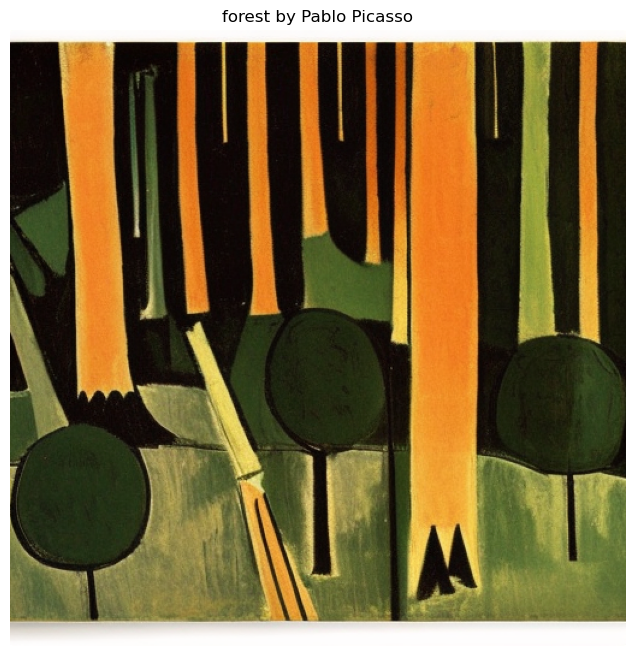

In [17]:
# Set the prompt of the payload to generate an image of a forest in the syle of Picasso
payload["prompt"] = "forest by Pablo Picasso"

# Prompt the model and generate the image
query_response(predictor, payload)

Below is an example with pencil sketch.

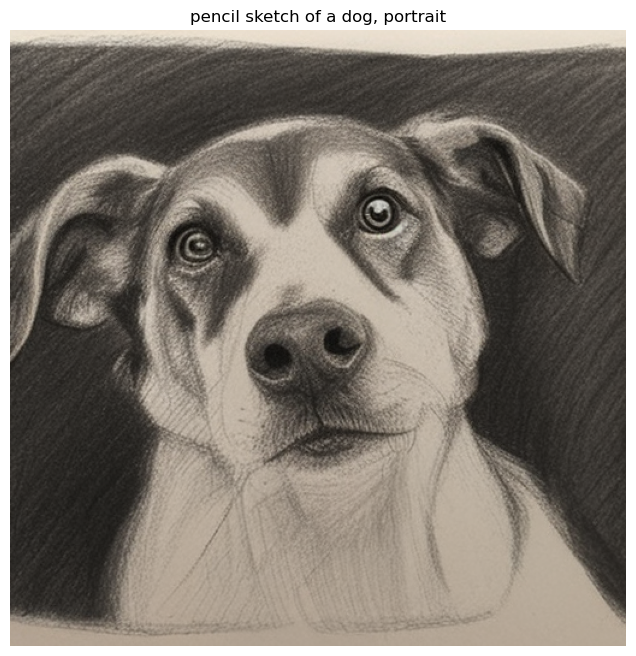

In [18]:
# Set the prompt of the payload to create a pencil sketch of a dog
payload["prompt"] = "pencil sketch of a dog, portrait"

# Prompt the model and generate the image
query_response(predictor, payload)

#### Negative prompting

Negative prompt is an important parameter while generating images using Stable Diffusion Models. It provides you an additional control over the image generation process and let you direct the model to avoid certain objects, colors, styles, attributes and more from the generated images.

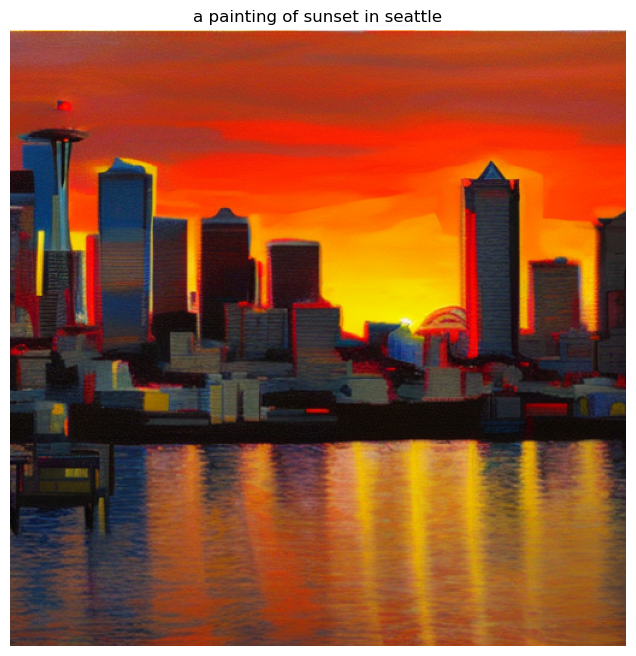

In [19]:
# Set the prompt of the payload to create a painting of a sunset in Seattle
payload["prompt"] = "a painting of sunset in seattle"

# Prompt the model and generate the image
query_response(predictor, payload)

You can change the intensity of the colors in this painting using the word "vibrant" as negative prompt.

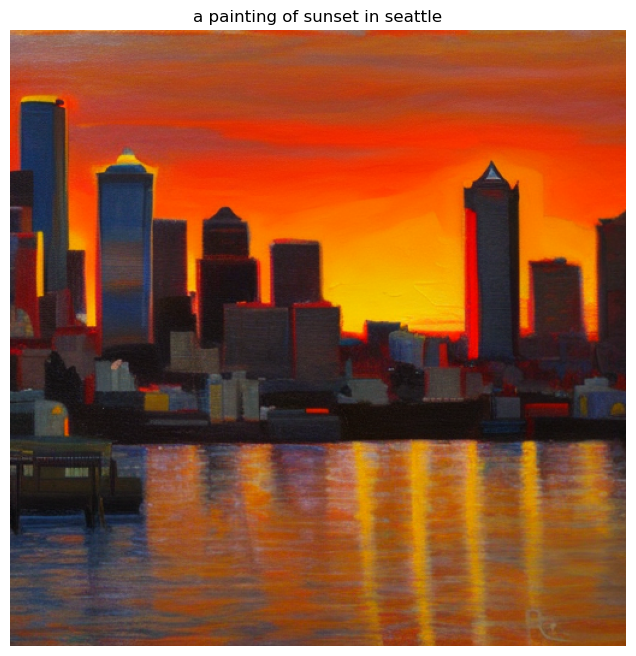

In [20]:
# Update the image using the word 'vibrant'
payload["negative_prompt"] = "vibrant"

# Prompt the model and generate the image
query_response(predictor, payload)

This also slightly changes the painted objects, but their overall placement seems to be preserved. 

#### Can the model generate images of objects it is unaware of?

Let's try to use the diffusion model to generate an image of the 5th generation echo device. 
Since this is a relatively new device, the model may not have come accross enough samples of it during its training.

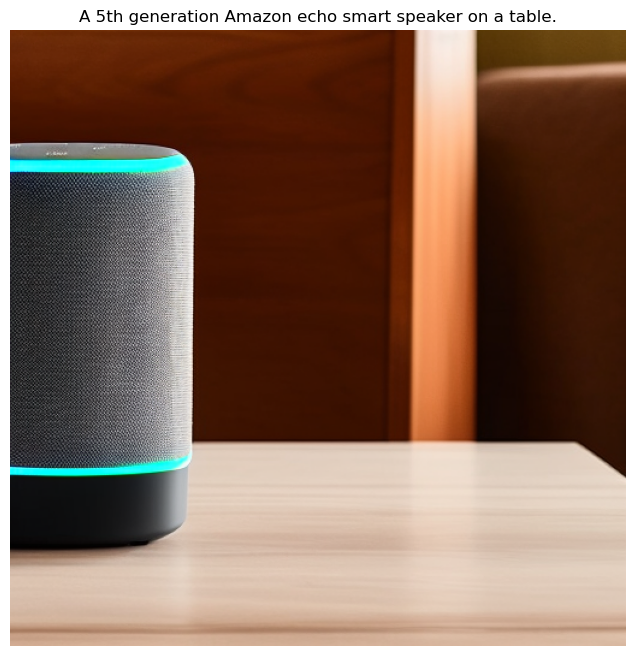

In [21]:
# Set the prompt of the payload to create a painting of a sunset in Seattle
payload["prompt"] = "A 5th generation Amazon echo smart speaker on a table."

# Prompt the model and generate the image
query_response(predictor, payload)

As you can observe, it does not have a clear idea about what the 5th generation echo device looks like. In the next section, we will try to adapt the diffusion model to this task by fine-tuning it. 

---
### <a name="#8">Clean up the endpoint</a>
(<a href="#0">Go to top</a>)

An endpoint deployed on SageMaker is persistent. So, once you are done using the model, please make sure to delete the model and the deployed endpoint.


In [23]:
# Delete the SageMaker endpoint
# predictor.delete_model()
# predictor.delete_endpoint()

---

### <a name="4">Quizzes</a>
(<a href="#0">Go to top</a>)

Well done on completing the lab! Now, it's time for a brief knowledge assessment.

<div style="border: 4px solid coral; text-align: center; margin: auto;">
    <h2><i>Try it Yourself!</i></h2>
    <br>
    <p style="text-align:center;margin:auto;">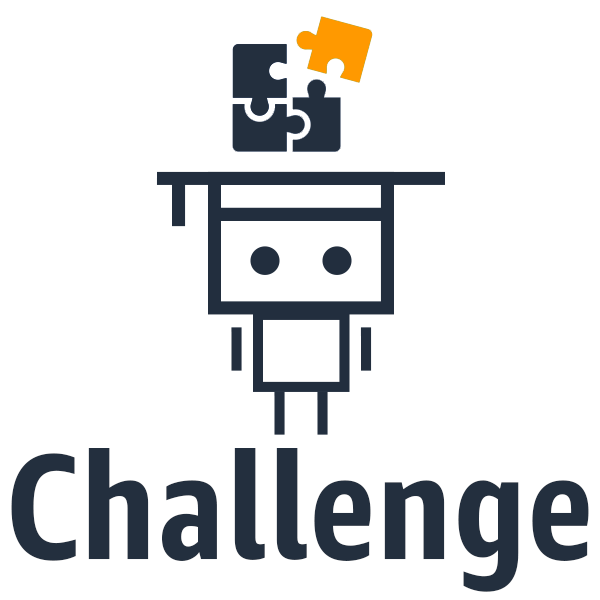 </p>
    <p style=" text-align: center; margin: auto;">Answer the following questions to test your understanding of using prompt templates for inference.</p>
    <br>
</div>

In [24]:
from mlu_utils.quiz_questions import *

lab1_question1

In [25]:
lab1_question2

<p style="padding: 10px; border: 1px solid black;">
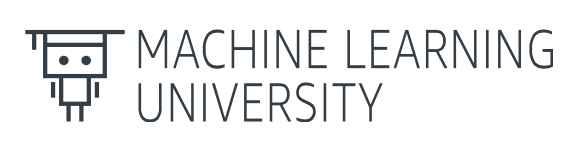 <br/>
    
## Thank you!